# **Visión por Computadora I**

### **Carrera de Especialización en Inteligencia Artificial, Facultad de Ingeniería**

### **Universidad de Buenos Aires, Mayo de 2024**


### Trabajo Práctico III: Edgar David Guarin Castro (davidg@marketpsychdata.com)

## Contenido
* [0. Importando paquetes](#0.-Importando-paquetes)
* [1. Deteccion de imagenes](#1.-Deteccion-de-imagenes)
    - [1.1 Test de Deteccion I](#1.1-Test-de-Deteccion-I)
    - [1.2 Test de Deteccion II](#1.2-Test-de-Deteccion-II)
    - [1.3 Test de Deteccion III](#1.3-Test-de-Deteccion-III)
* [2. Deteccion Multiple](#2.-Deteccion-Multiple)
________________________________

## 0. Importando paquetes

In [1]:
%matplotlib inline
import numpy as np 
import cv2 as cv
import matplotlib.pyplot as plt

## 1. Deteccion de imagenes

En el siguiente trabajo se busca detectar un logotipo (Coca Cola) en diferentes imágenes, haciendo uso de un *template* que permita detectar las regiones donde se maximizan las métricas de similitud.

Para ello se cargan inicialmente las imágenes a analizar y el *template* que permitirá hacer la detección del logo de Coca Cola:

(175, 400, 3) (1389, 1389, 3)


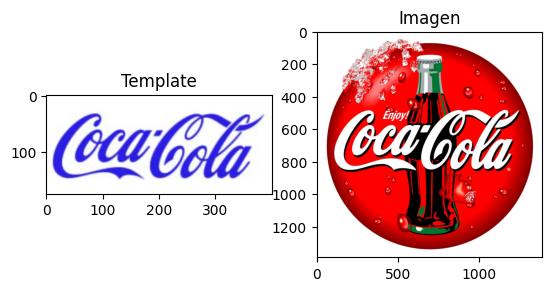

In [2]:
IMG_PATH = "images"

# Cargando la imagen a analizar
img = cv.imread(f'{IMG_PATH}/COCA-COLA-LOGO.jpg')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
# img_eqzd = cv.equalizeHist(img_gray)

# Cargando el template
template = cv.imread('template/pattern.png')
template_gray = cv.cvtColor(template, cv.COLOR_BGR2GRAY)
# template_eqzd = cv.equalizeHist(template_gray)

# Mostrando las imágnes a comparar
plt.figure()
plt.subplot(1,2,1)
plt.title("Template")
plt.imshow(template, cmap='gray')
plt.subplot(1,2,2)
plt.title("Imagen")
plt.imshow(img_rgb)

print(template.shape, img_rgb.shape)

A continuación se crea una función que permitirá comparar el resultado de diferentes métodos de comparación ofrecidos por OpenCV. La función permite hacer comparaciones entre todos los métodos de **matchTemplate** por defecto (*meths=all*) u obtener el resultado de un método en particular.

In [3]:
def matching_methods(image,template,meths="all") -> (np.ndarray, np.ndarray):
    """
    Métodos de comparación entre imágenes
    ----------
    Parámetros
    ----------
    image:np.ndarray 
        Imagen a ser analizada

    tempplate:np.ndarray 
        Imagen del template para buscar coincidencias

    meths:str
        "all" por defecto usa todos los métodos de matchTemplate
        También puede tomar como valor el noombre de un método en específico, como meths="cv.TM_CCOEFF"
    
    ----------
    Respuesta
    ----------
    Resultado:np.ndarray
        Resultado de aplicar los métodos a través de matchTemplate

    Region Detectada:np.ndarray
        Imagen original con la región donde fue detectado el logo
    """
    w, h = template.shape[::-1]

    if meths == "all":
        # Los 6 métodos posibles para comparación:
        methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
                    'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']
    else:
        methods = [meths]

    for meth in methods:
        # Haciendo una copia de la imagen porque ciclo a ciclo se dibujan rectángulos
        img_salida = img_rgb.copy()
        
        method = eval(meth)
        
        # Aplicando la coincidencia de patrones
        res = cv.matchTemplate(image, template, method)
        
        # Encontrando los valores máximos y mínimos
        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
        
        # Si el método es TM_SQDIFF o TM_SQDIFF_NORMED, se toma el mínimo
        if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
            top_left = min_loc
        else:
            top_left = max_loc
        
        # Marcando el lugar donde haya encontrado el logo
        bottom_right = (top_left[0] + w, top_left[1] + h)
        cv.rectangle(img_salida,top_left, bottom_right, (0, 0, 255), 10)
        
        # Graficando el procesamiento y la salida
        plt.figure()
        
        # Resultado de coincidencia
        plt.subplot(121),plt.imshow(res,cmap = 'gray')
        plt.title('Resultado del Matching'), plt.xticks([]), plt.yticks([])
        
        # Imagen original con recuadros
        plt.subplot(122),plt.imshow(img_salida)
        plt.title('Región Detectada'), plt.xticks([]), plt.yticks([])
        
        plt.suptitle(meth)
        plt.show()

### 1.1 Test de Deteccion I

Usando la función **matching_methods** definida anteriormente, se muestran a continuación los resultados del proceso de detección usando el template y la imagen original para todos los métodos de comparación:

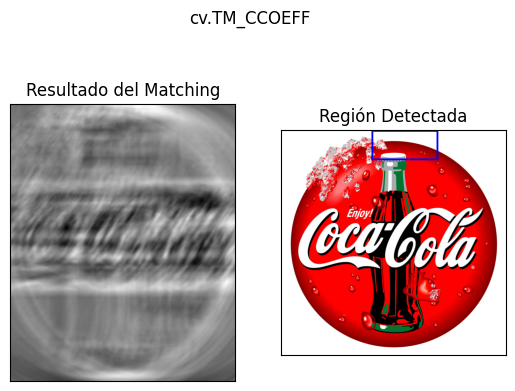

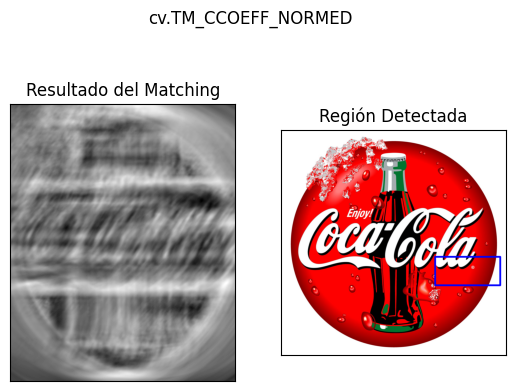

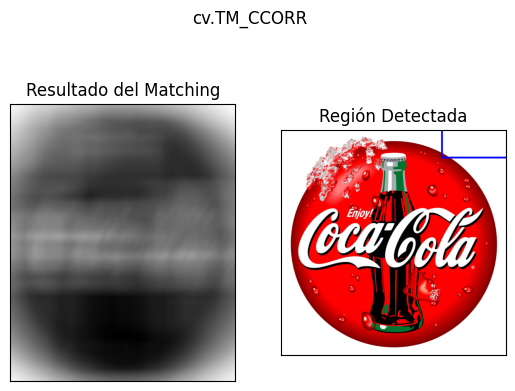

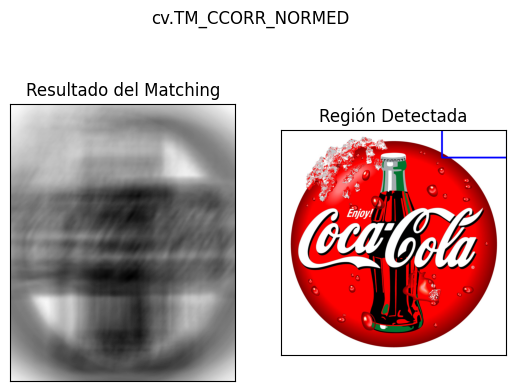

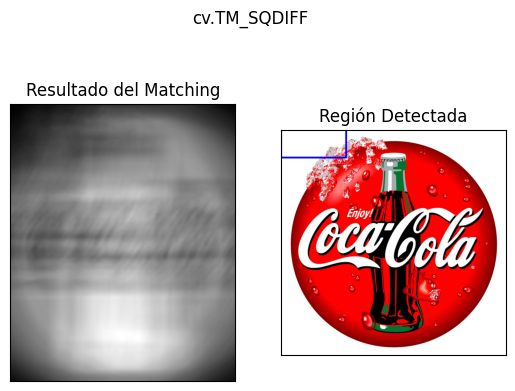

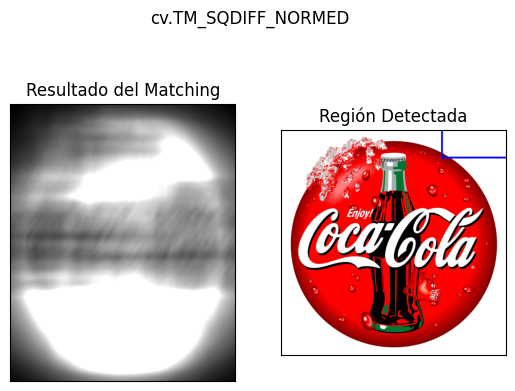

In [4]:
matching_methods(img_gray,template_gray)

Se observa que ninguno de los métodos es capaz de detectar el logo de Coca Cola, lo que se debe a diferentes factores:
- El template usado tiene un tamaño menor que el logo de la imagen.
- Mientras el *template* posee un fondo blanco con letras oscuras, la imagen posse un fondo rojo con letras claras.
- Pueden haber problemas de resolución que afectan la detección de detalles.

### 1.2 Test de Deteccion II

Para intentar solucionar estos problemas, se ecualizan las imágenes, se invierten los colores del *template* y luego se ajusta el tamaño del *template* con diferentes escalas para mejorar la detección.

Los colores del *template* se invierten, ya que en este caso el logo del *template* posee colores oscuros, mientras que el de la imagen posee colores claros. La inversión garantiza que el contraste de ambas imágenes sea semejante.

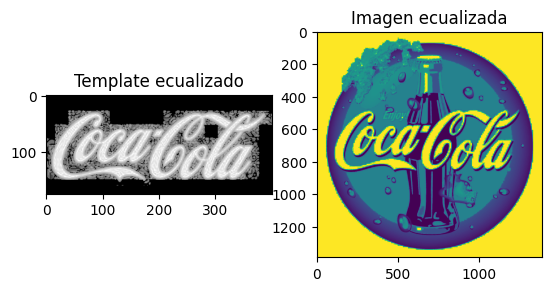

In [5]:
# Ecualizando las imágenes
img_eqzd = cv.equalizeHist(img_gray)
template_eqzd = cv.equalizeHist(template_gray)

# Invirtiendo los colores del template
template_inv = 255 - template_eqzd

# Mostrando las imágnes a comparar
plt.figure()
plt.subplot(1,2,1)
plt.title("Template ecualizado")
plt.imshow(template_inv, cmap='gray')
plt.subplot(1,2,2)
plt.title("Imagen ecualizada")
plt.imshow(img_eqzd)

Para ajustar el tamaño del *template* se usa un factor de escala definido como el mínimo entre la razones entre las alturas y los anchos. Esto asegura que el template reescalado encaje completamente dentro de la imagen en ambas dimensiones. Con este factor de escala, se ajusta el *template* al ancho de la imagen a analizar (100%) y luego se reduce al 80, 60, 40 y 20%.

Luego, para cada escala, se define el nuevo tamaño del *template*, multiplicando cada dimensión del *template* original por el valor de escala. Nótese que los valores son convertidos a enteros ya que las dimensiones de la imagen en píxeles deben ser valores enteros.

Finalmente, se usa la función cv.resize() para redimensionar el template al new_size calculado. Esta función toma el *template* y el nuevo tamaño como argumentos y devuelve una versión redimensionada del *template*. Esto se logra internamente interpolando los valores de los píxeles del template original para ajustarlos al nuevo tamaño.

El *template* reescalado se usa para evaluar cada uno de los métodos:

Escala del template: 100%


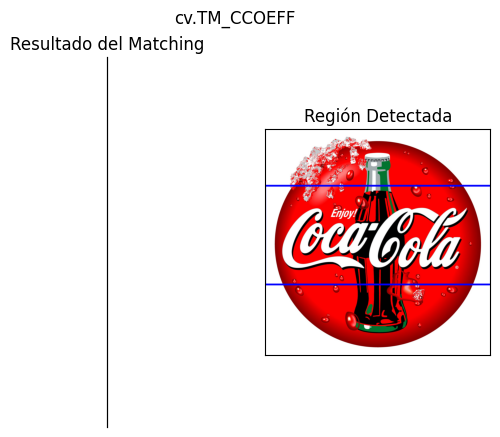

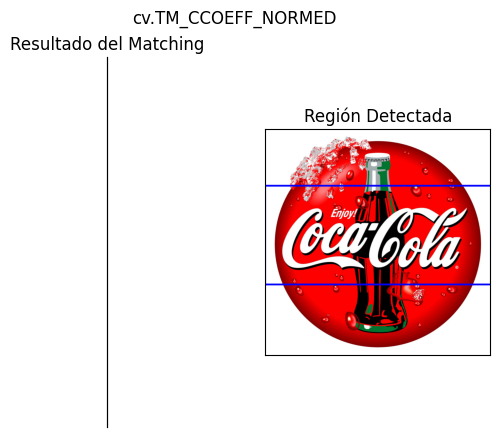

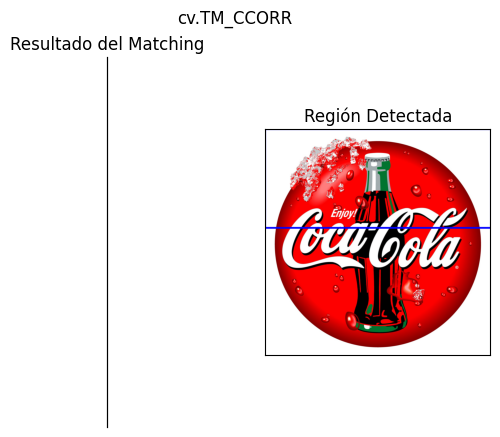

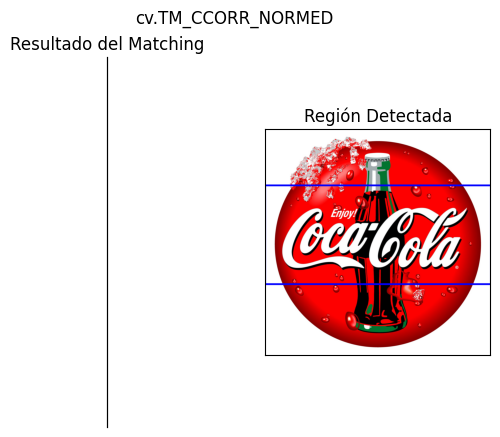

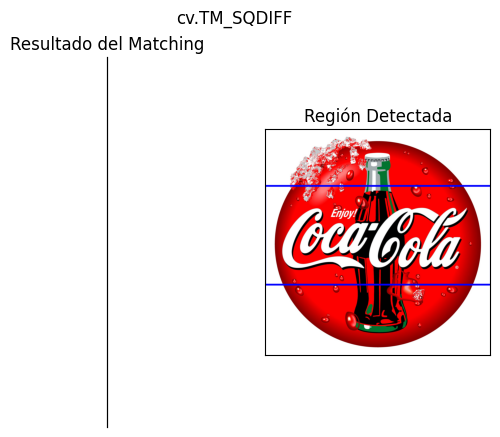

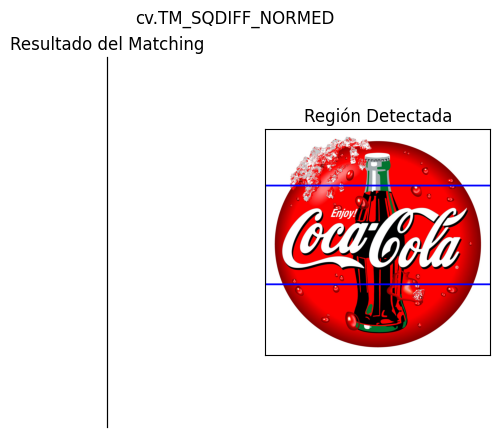

Escala del template: 80.0%


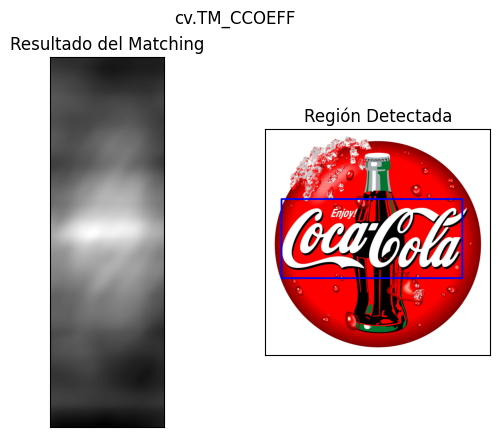

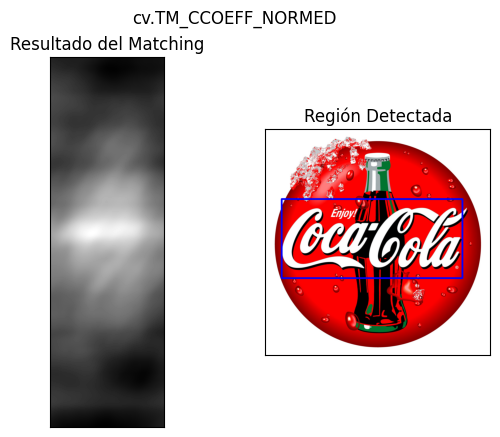

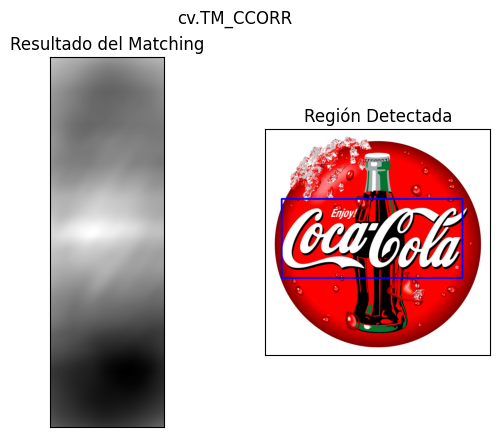

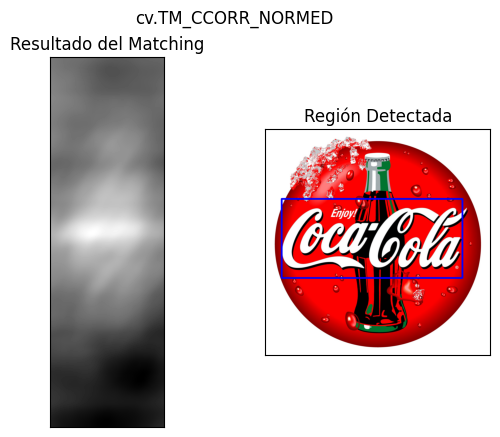

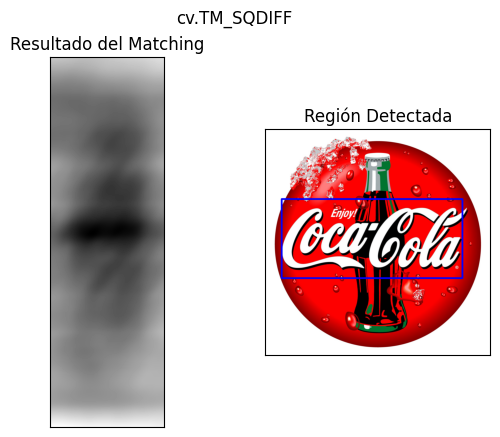

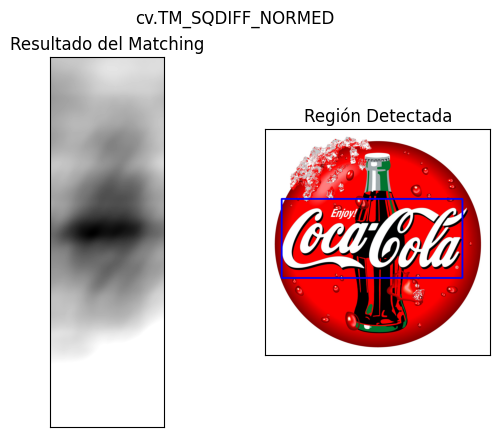

Escala del template: 60.0%


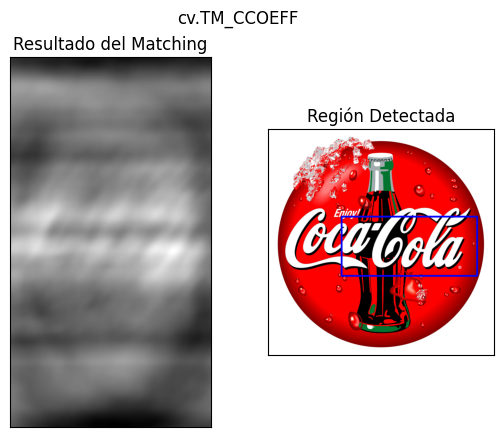

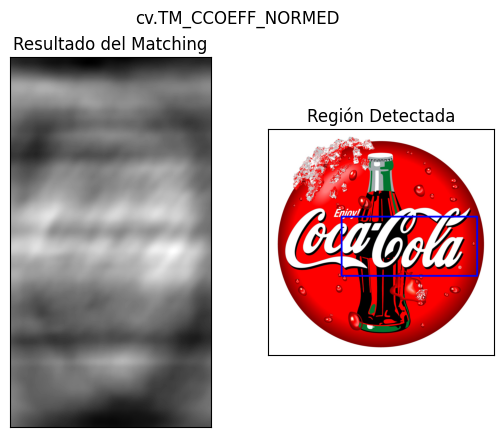

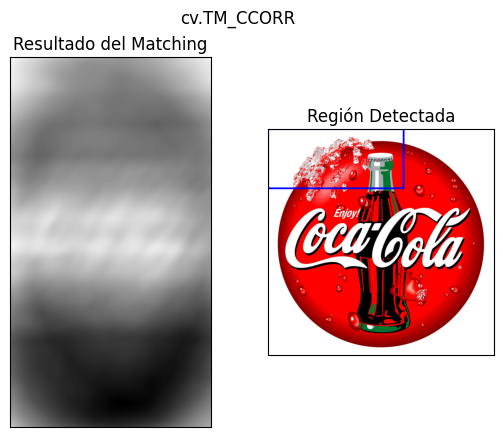

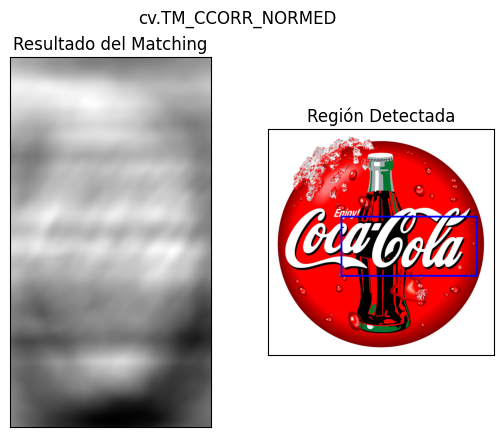

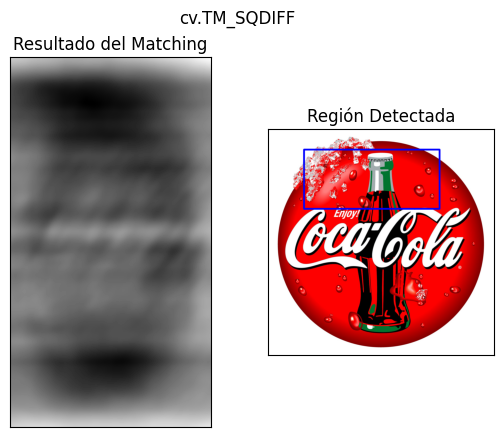

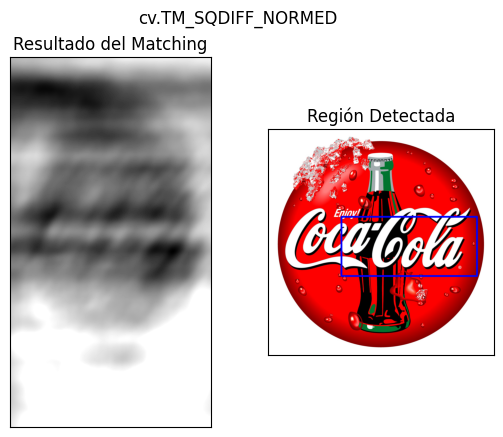

Escala del template: 40.0%


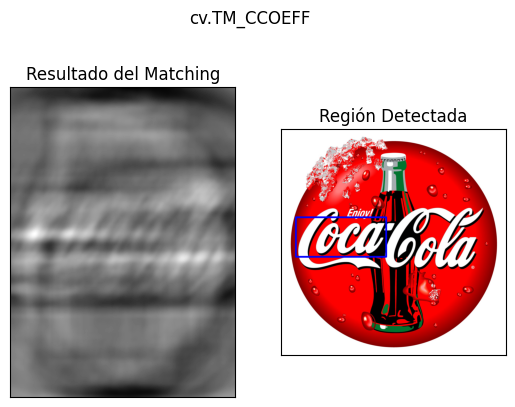

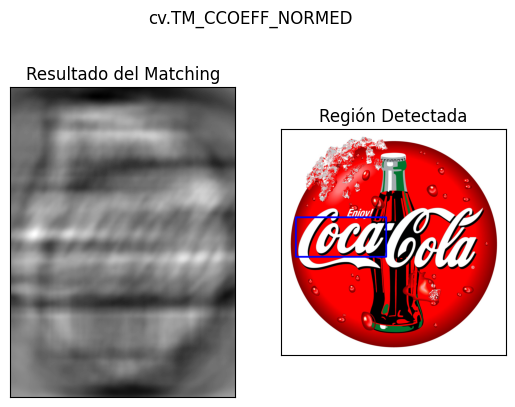

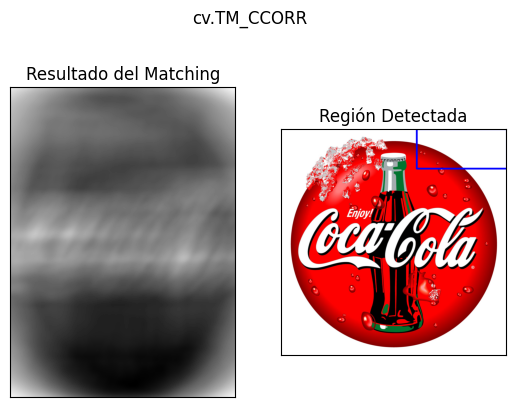

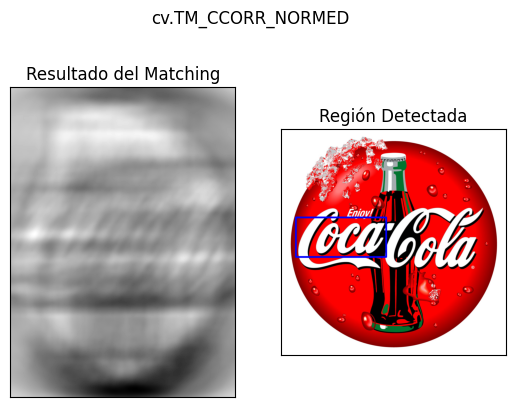

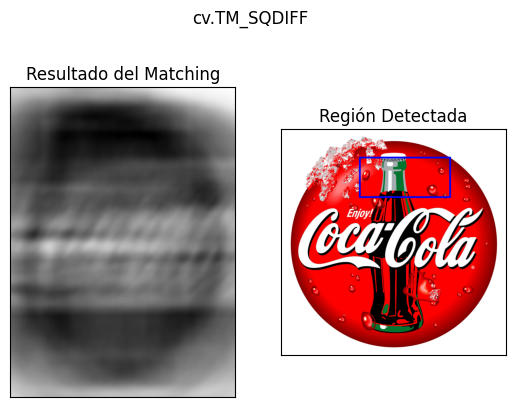

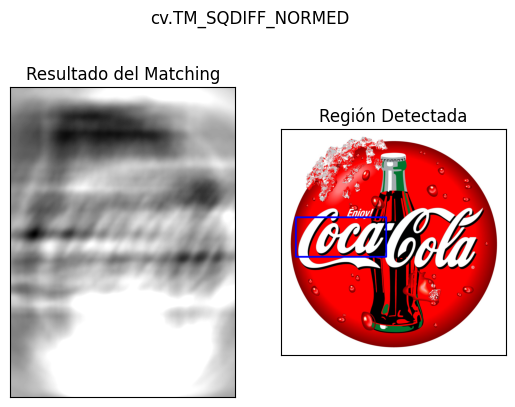

Escala del template: 20.0%


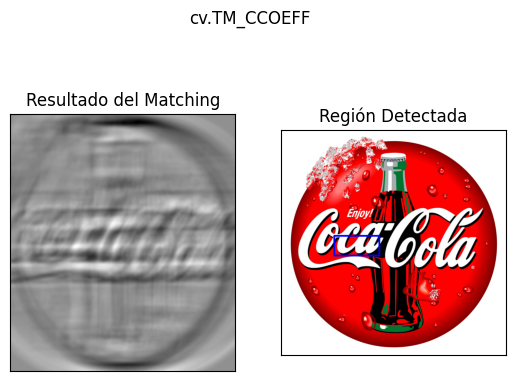

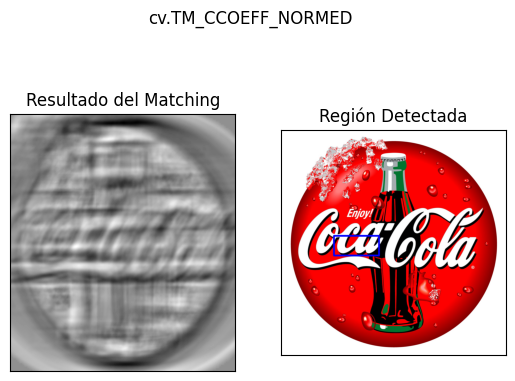

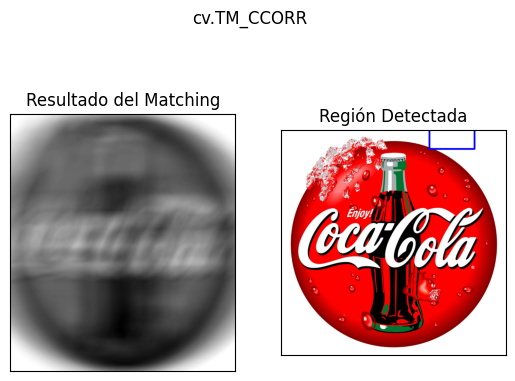

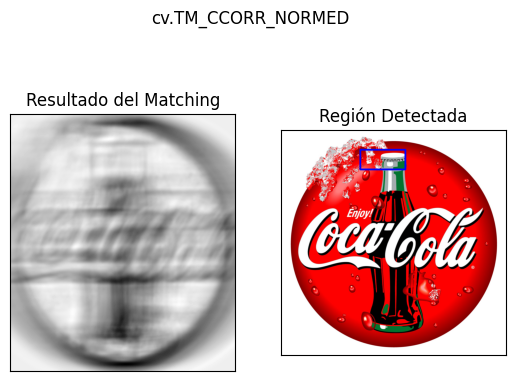

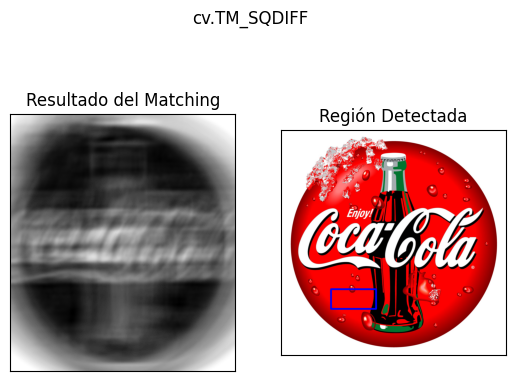

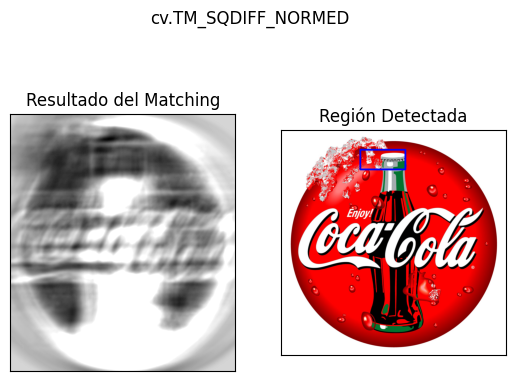

In [6]:
# Calculando el factor de escala
scale_factor = min(img_eqzd.shape[0] / template_inv.shape[0], img_eqzd.shape[1] / template_inv.shape[1])

# Calculando las escalas a ser usadas para redimensionar el template
scales = []
percentages = [1,0.8,0.6,0.4,0.2]
for p in percentages:
    scales.append(scale_factor * p)

# Redimensionando el template y obteniendo los resultados de cada matching para cada escala
for i,scale in enumerate(scales):
    new_size = (int(template_inv.shape[1] * scale), int(template_inv.shape[0] * scale))
    resized_template = cv.resize(template_inv, new_size)

    print(f"Escala del template: {percentages[i]*100}%")
    matching_methods(img_eqzd,resized_template)

Estos resultados muestran que todos los métodos de comparación son efectivos al encontrar el logo en la imagen cuando las imágenes son ecualizadas, y el *template* es modificado al invertir sus colores y al ajustarlo a un 80% del ancho de la imagen. Cuando se usan tamaños menores, los métodos de comparación tienen más problemas para detectar el logo.

Si los colores del *template* no son invertidos o si el tamaño del mismo no se cambia, ninguno de los métodos de *matching* logra detectar el logo, lo cual fue evidenciado en pruebas no mostradas aquí.

No obstante, esta metodología es poco práctica, ya que se debe saber de antemano si es necesario invertir o no los colores del *template* para evitar los efectos del fondo. Por ejemplo, si la imagen a ser analizada posee letras oscuras como el *template* original, la inversión de colores es innecesaria.

### 1.3 Test de Deteccion III

Para evitar los inconvenientes presentados con anterioridad, se propone a continuación trabajar con imágenes de contraste mejorado. Con esta aproximación es posible evitar los efectos del fondo, al tiempo de que los detalles de las imágenes son mejorados.

Para obtener las imágenes de contraste, se usa la función **enhanced_contrast_map** definida a continuación, que utiliza el filtro de Sobel para detectar bordes. También se ha creado la función **template_resize** para reescalar el template como en el caso anterior.

In [25]:
def enhanced_contrast_map(image:np.ndarray, ksize=3, scale=1, delta=0) -> (np.ndarray):
    """
    Creación de mapas de contraste mejorados
    ----------
    Parámetros
    ----------
    image:np.ndarray 
        Imagen a ser tratada

    ksize:int
        Tamaño del kernel. Número entero impar y positivo

    scale:float
        Escala para resaltar bordes débiles

    delta:float
        Delta para ajustar los valores de intensidad
    
    ----------
    Respuesta
    ----------
    contrast_map:np.ndarray
        Mapa de contraste de la imagen
    """
    # Asegurando que la imagen esté en escala de grises
    if len(image.shape) > 2:
        image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

    # Aplicando el filtro de Sobel para detectar bordes en x e y
    sobel_x = cv.Sobel(image, cv.CV_64F, 1, 0, ksize=ksize, scale=scale, delta=delta)
    sobel_y = cv.Sobel(image, cv.CV_64F, 0, 1, ksize=ksize, scale=scale, delta=delta)

    # Calculando la magnitud de los gradientes
    sobel = np.sqrt(sobel_x**2 + sobel_y**2)

    # Normalizando para escala de 0 a 255 y convertir a uint8, de modo que la imagen pueda ser usado durante el matching
    sobel_normalized = cv.normalize(sobel, None, 0, 255, cv.NORM_MINMAX)
    sobel_uint8 = np.uint8(sobel_normalized)

    return sobel_uint8


# Porcentajes para reescalar el template
percentages = [1,0.8,0.6,0.4,0.2]

def template_resize(image,template) -> (list):
    """
    Reescalado del template
    ----------
    Parámetros
    ----------
    image:np.ndarray 
        Imagen a ser analizada

    template:np.ndarray 
        Imagen del template para reescalar y buscar coincidencias
    
    ----------
    Respuesta
    ----------
    templates:list
        Lista con todos los templates despues de reescalar en diferentes porcentajes
    """
    # Calculando el factor de escala
    scale_factor = min(image.shape[0] / template.shape[0], image.shape[1] / template.shape[1])

    # Calculando las escalas a ser usadas para redimensionar el template
    scales = []
    for p in percentages:
        scales.append(scale_factor * p)

    # Redimensionando el template y obteniendo los resultados de cada matching para cada escala
    templates = []
    for i,scale in enumerate(scales):
        new_size = (int(template.shape[1] * scale), int(template.shape[0] * scale))
        resized_template = cv.resize(template, new_size)

        templates.append(resized_template)

    return templates

Luego se aplican las funciones anteriores para crear los mapas de contraste de la imagen y el *template*, así como para reescalar el *template*:

(175, 400) (1389, 1389)


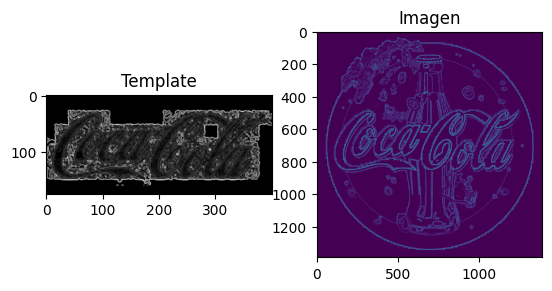

In [8]:
img_contrast = enhanced_contrast_map(img_eqzd)
template_contrast = enhanced_contrast_map(template_eqzd)

# Mostrando las imágnes a comparar
plt.figure()
plt.subplot(1,2,1)
plt.title("Template")
plt.imshow(template_contrast, cmap='gray')
plt.subplot(1,2,2)
plt.title("Imagen")
plt.imshow(img_contrast)

print(template_contrast.shape, img_contrast.shape)

Nuevamente se aplica el reescalado del *template* y se obtienen los resultados del *matching*:

Escala del template: 100%


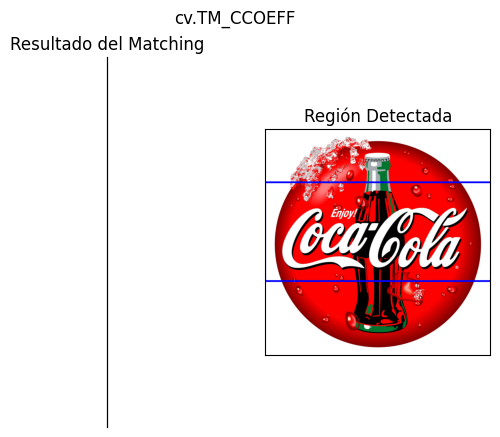

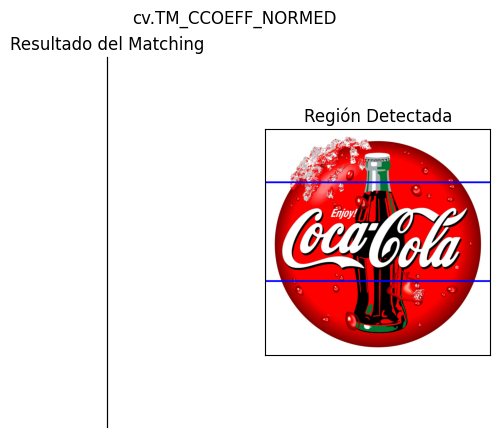

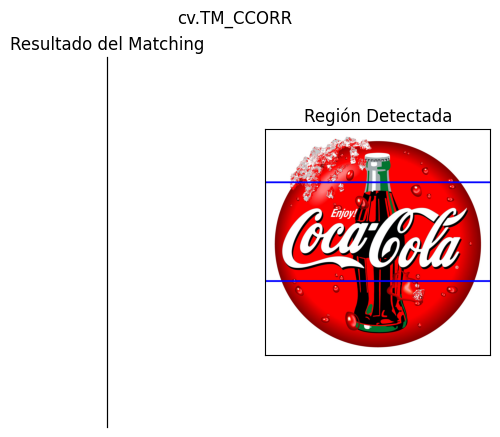

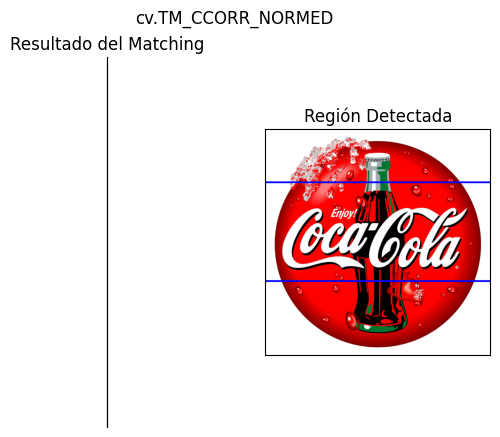

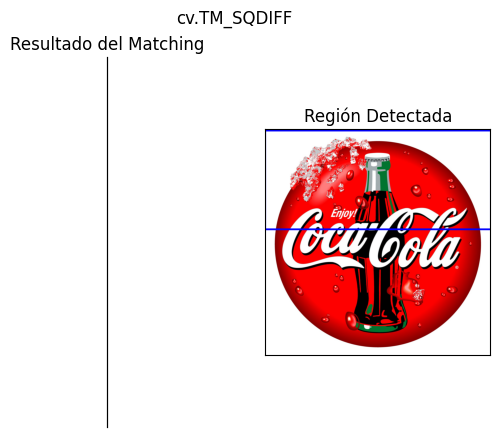

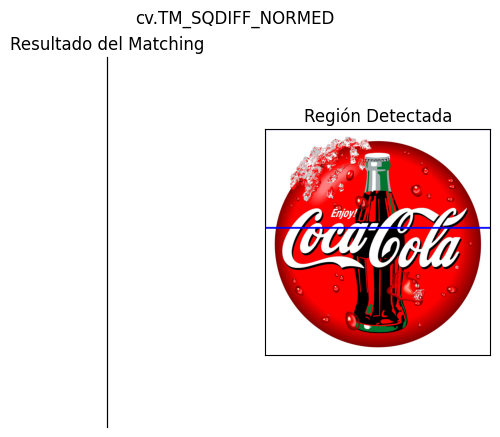

Escala del template: 80.0%


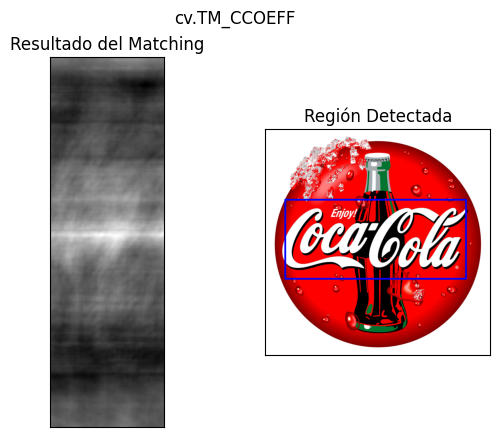

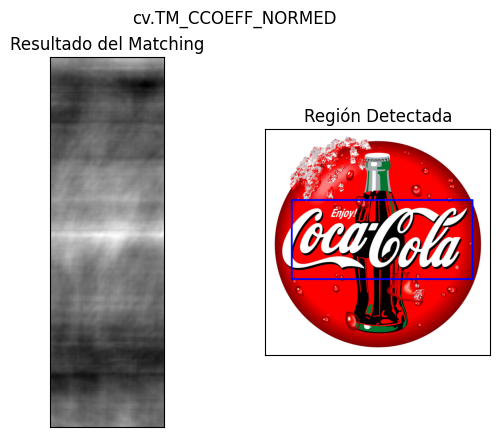

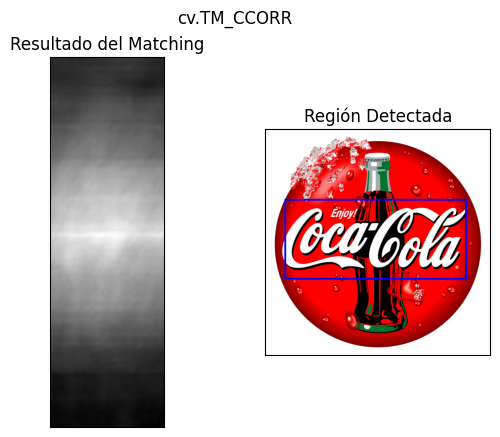

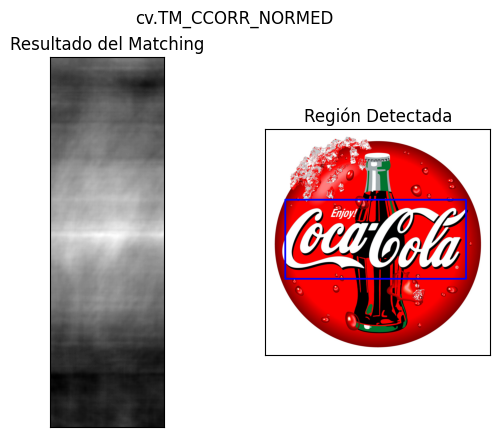

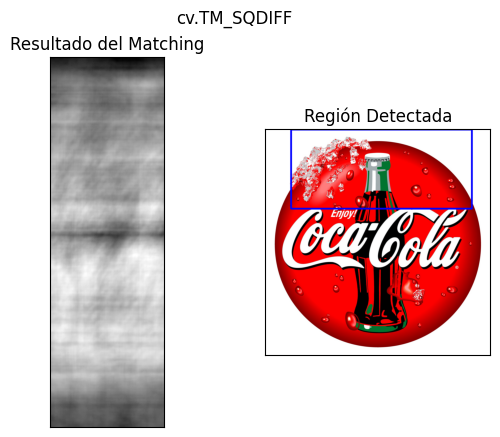

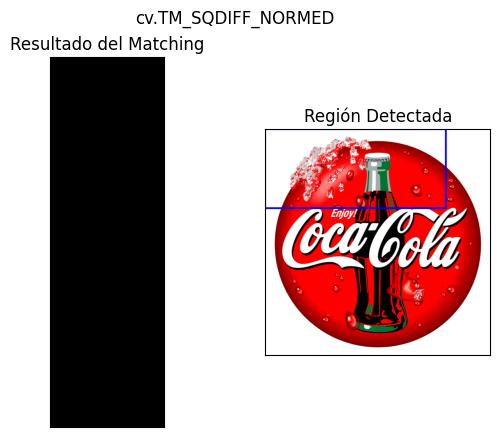

Escala del template: 60.0%


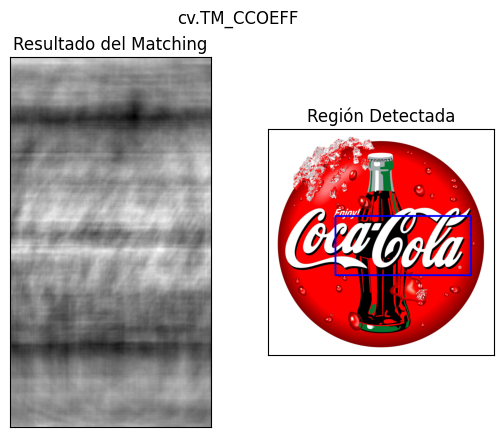

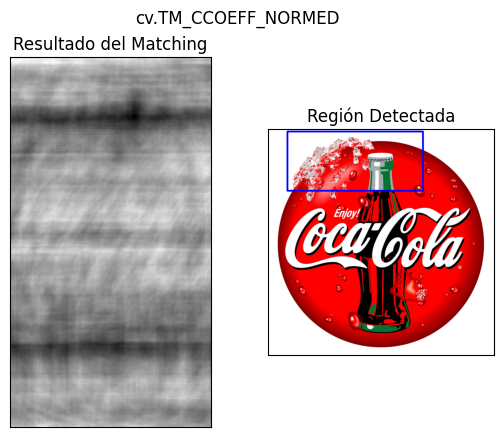

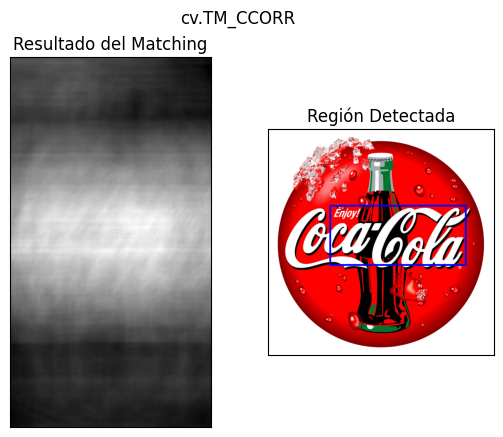

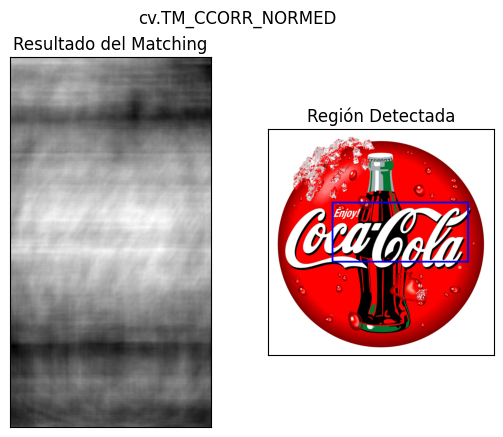

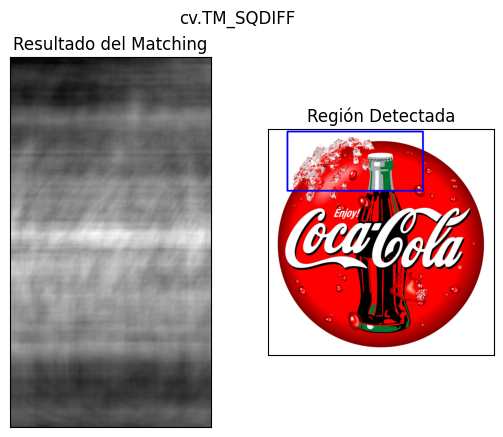

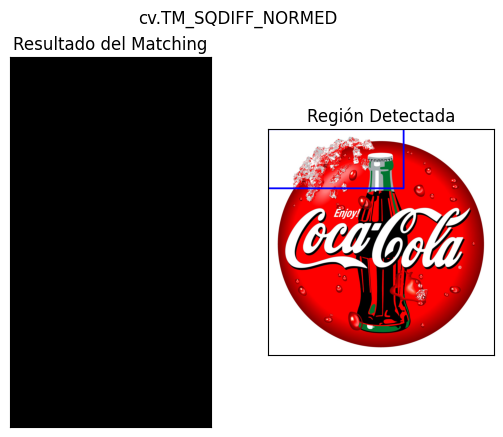

Escala del template: 40.0%


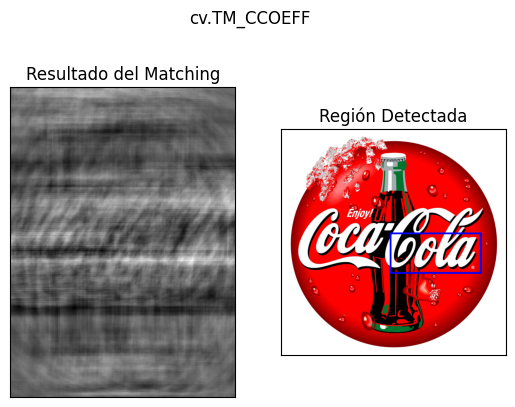

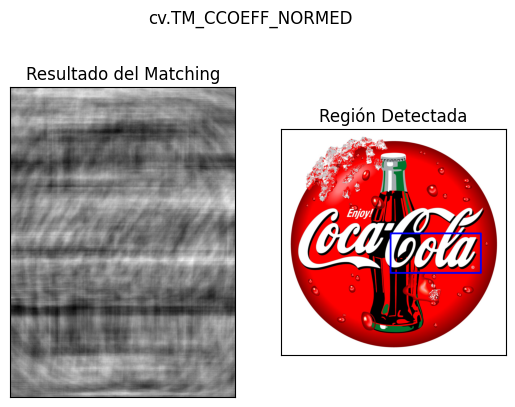

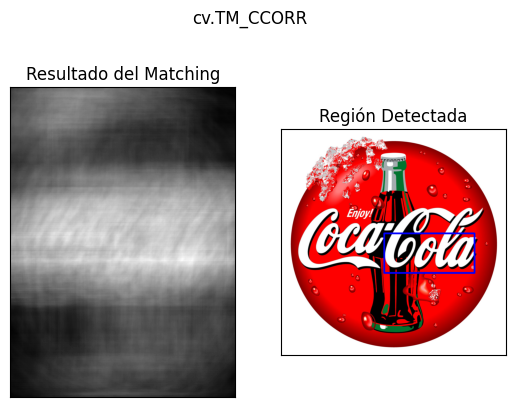

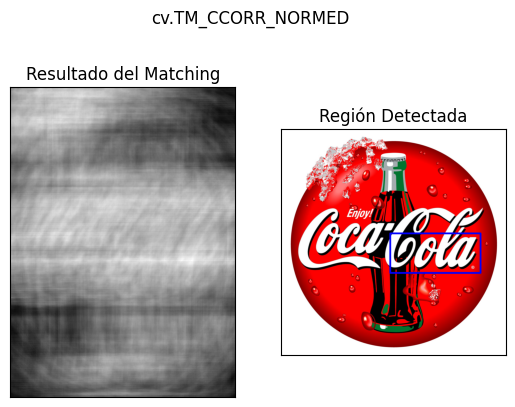

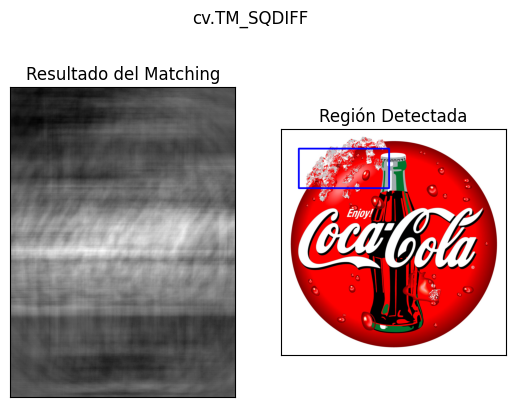

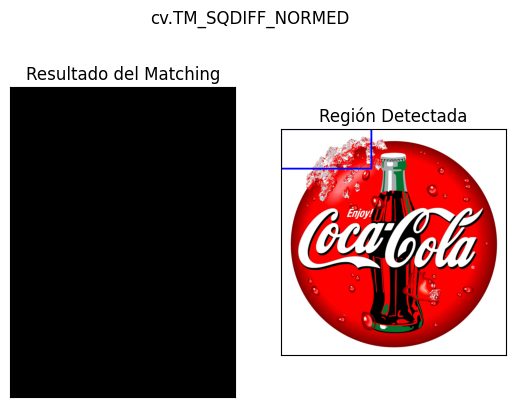

Escala del template: 20.0%


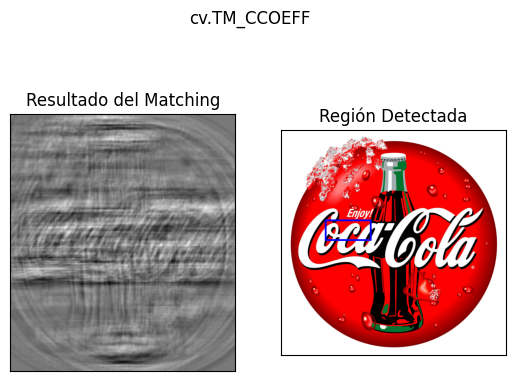

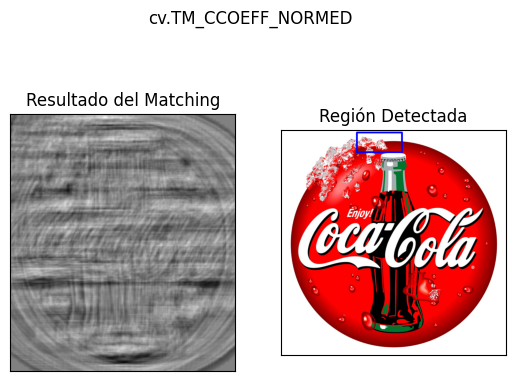

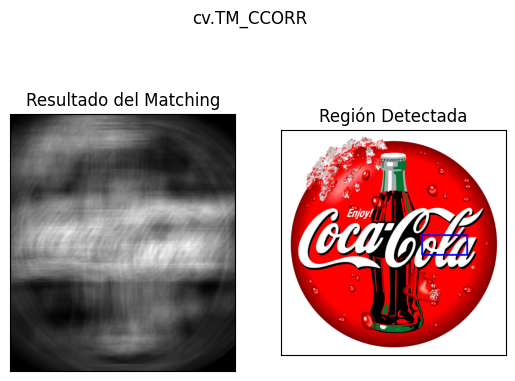

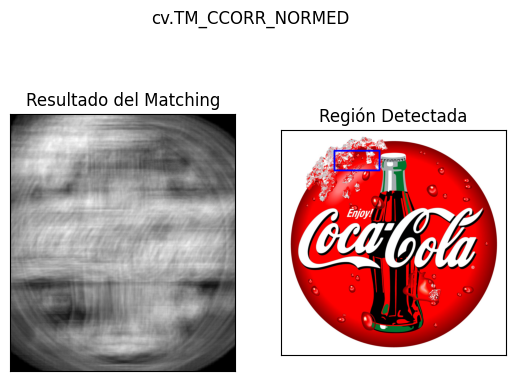

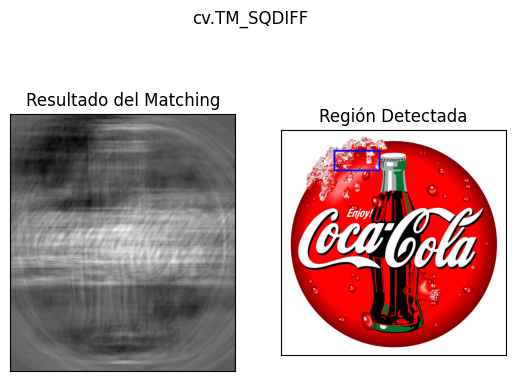

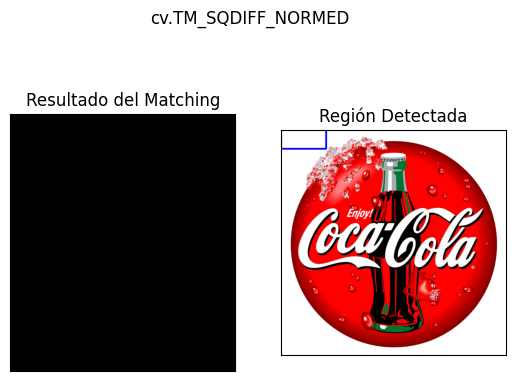

In [9]:
templates = template_resize(img_contrast,template_contrast)

for i,temp in enumerate(templates):
    print(f"Escala del template: {percentages[i]*100}%")
    matching_methods(img_contrast,temp)

Como en el test anterior, los mejores resultados se obtienen con un *template* reducido al 80%, sin embargo esta vez los métodos que usan diferencia de cuadrados fallan al detectar el logo.

La metodología funciona para otras imágenes como se muestra a continuación:

(175, 400, 3) (493, 715, 3)


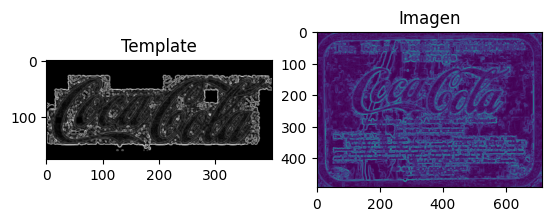

In [10]:
# Cargando la imagen a analizar
img = cv.imread(f'{IMG_PATH}/coca_retro_1.png')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img_eqzd = cv.equalizeHist(img_gray)
img_contrast = enhanced_contrast_map(img_eqzd)

# Mostrando las imágnes a comparar
plt.figure()
plt.subplot(1,2,1)
plt.title("Template")
plt.imshow(template_contrast, cmap='gray')
plt.subplot(1,2,2)
plt.title("Imagen")
plt.imshow(img_contrast)

print(template.shape, img_rgb.shape)

Esta vez se utiliza un solo método de comparación:

Escala del template: 100%


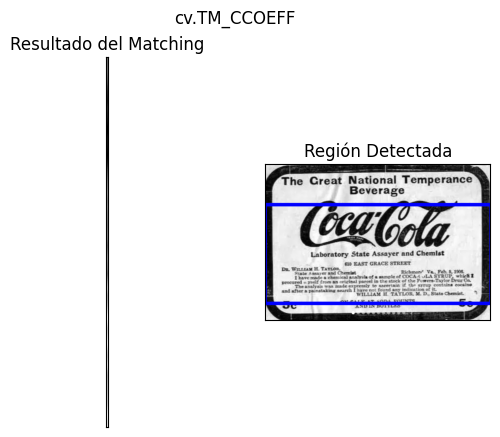

Escala del template: 80.0%


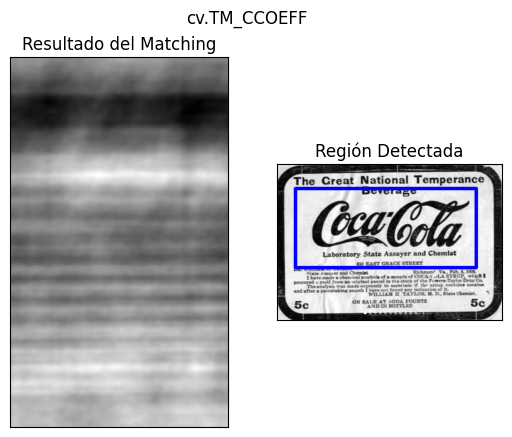

Escala del template: 60.0%


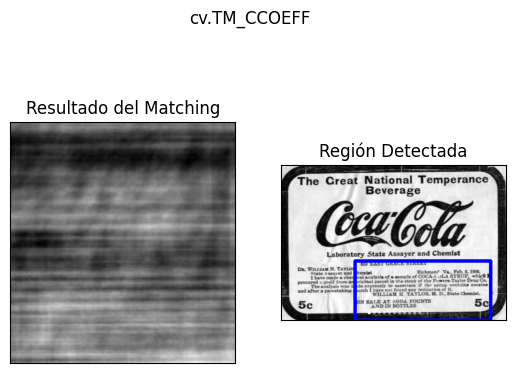

Escala del template: 40.0%


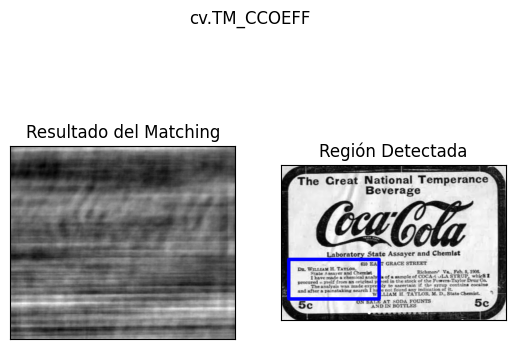

Escala del template: 20.0%


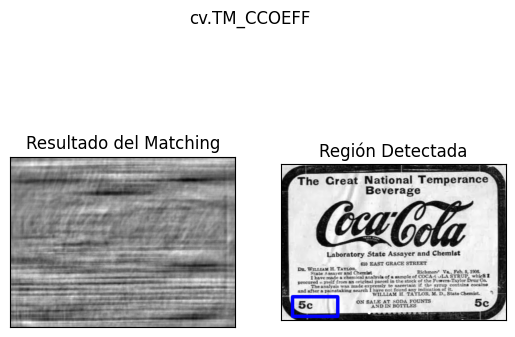

In [11]:
templates = template_resize(img_contrast,template_contrast)

for i,temp in enumerate(templates):
    print(f"Escala del template: {percentages[i]*100}%")
    matching_methods(img_contrast,temp,meths='cv.TM_CCOEFF')

En este caso, el cambio de colores no es un problema y se aprecia detección del logo cuando el *template* se reescala al 80% de la imagen analizada.

## 2. Deteccion Multiple

El método de comparación por imágenes de contraste se prueba en la siguiente celda para la detección múltiple del logo de Coca Cola, en una imagen donde dicho logo aparece varias veces. Los parámetros de tamaño de kernel, escala y umbral de coincidencia presentados aquí, fueron los que generaron los mejores resultados.

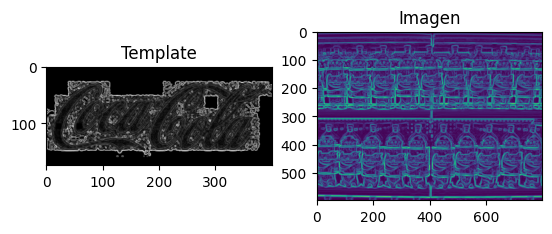

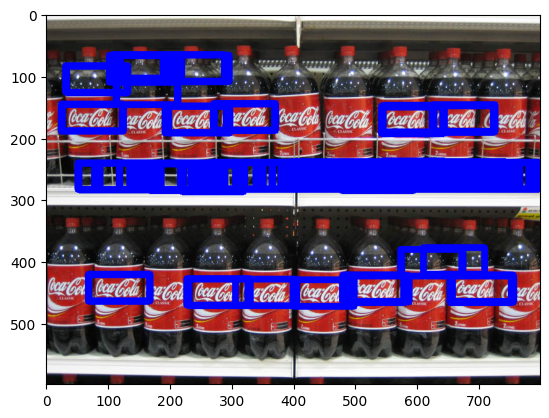

In [20]:
# Cargando y tratando la imagen a ser analizada
img = cv.imread(f'{IMG_PATH}/coca_multi.png')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
img_eqzd = cv.equalizeHist(img_gray)
img_contrast = enhanced_contrast_map(img_eqzd, ksize=9, scale=10, delta=0.5)

# Tratando el template
template_contrast = enhanced_contrast_map(template_eqzd, ksize=3, scale=1, delta=0)


# Mostrando las imágnes a comparar
plt.figure()
plt.subplot(1,2,1)
plt.title("Template")
plt.imshow(template_contrast, cmap='gray')
plt.subplot(1,2,2)
plt.title("Imagen")
plt.imshow(img_contrast)

# Calculando el factor de escala
scale_factor = min(img_contrast.shape[0] / template_contrast.shape[0], img_contrast.shape[1] / template_contrast.shape[1])

# Calculando la escala a ser usadas para redimensionar el template
scale = scale_factor * 0.125

# Redimensionando el template
new_size = (int(template_contrast.shape[1] * scale), int(template_contrast.shape[0] * scale))
resized_template = cv.resize(template_contrast, new_size)

# Aplicando el método de comparación
w, h = resized_template.shape[::-1]
res = cv.matchTemplate(img_contrast,resized_template,cv.TM_CCORR_NORMED)

# Fijando un umbral de "coincidencia"
threshold = 0.61

loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    cv.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,0,255), 10)


plt.figure()
plt.imshow(img_rgb)    
plt.show()

El método de comparación por imágenes de contraste permite detectar varios logos principalmente en la fila inferior de la imagen, pero al mismo tiempo genera varios falsos positivos, sobre todo en la fila superior de la imagen. Esto porque la rejilla que se observa en la imagen, produce patrones de contraste semejantes a los del template, lo que acaba confundiendo al método.

Como alternativa, se propone a continuación la aplicación de filtros gaussianos y laplacianos para ayudar a la identificación de bordes en la imagen y el template. De esta forma, se busca mejorar el proceso de detección. En este sentido se define la siguiente función para tratar las imágenes:

In [22]:
def laplacian_filter(image:np.ndarray, kernel_size=3) -> (np.ndarray):
    """
    Filtrado Laplaciano de imágenes
    ----------
    Parámetros
    ----------
    image:np.ndarray 
        Imagen a ser tratada

    kernel_size:int
        Tamaño del kernel. Número entero impar y positivo
    
    ----------
    Respuesta
    ----------
    laplacian:np.ndarray
        Imagen filtrada
    """
    # Convirtiendo la imagen a escala de grises si es necesario
    if len(image.shape) > 2:
        image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    
    # Aplicando un filtro Gaussiano para suavizar la imagen y reducir el ruido
    image_blurred = cv.GaussianBlur(image, (3, 3), 0)
    
    # Aplicando el filtro de Laplace
    laplacian = cv.Laplacian(image_blurred, cv.CV_64F, ksize=kernel_size)
    
    # Convirtiendo de vuelta a uint8
    laplacian = cv.convertScaleAbs(laplacian)
    
    return laplacian

Se carga nuevamente la imagen, se le aplica el filtro no solo a ella sino al template también, y se muestran los resultados:

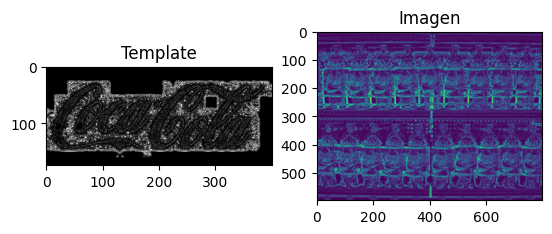

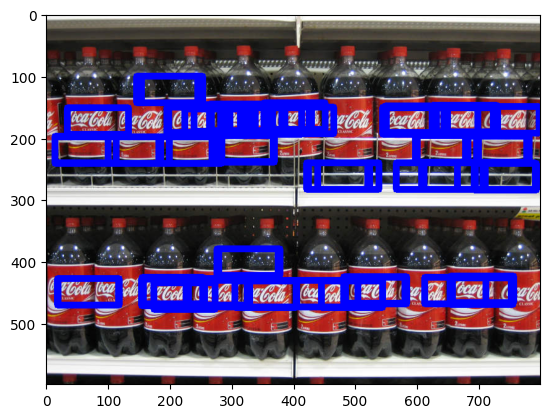

In [24]:
img = cv.imread(f'{IMG_PATH}/coca_multi.png')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
img_eqzd = cv.equalizeHist(img_gray)
img_enhanced = laplacian_filter(img_eqzd, kernel_size=3)

template_enhanced = laplacian_filter(template_eqzd, kernel_size=3)

# Mostrando las imágnes a comparar
plt.figure()
plt.subplot(1,2,1)
plt.title("Template")
plt.imshow(template_enhanced, cmap='gray')
plt.subplot(1,2,2)
plt.title("Imagen")
plt.imshow(img_enhanced)

# Calculando el factor de escala
scale_factor = min(img_enhanced.shape[0] / template_enhanced.shape[0], img_enhanced.shape[1] / template_enhanced.shape[1])

# Calculando las escalas a ser usadas para redimensionar el template
scale = scale_factor * 0.125

new_size = (int(template_enhanced.shape[1] * scale), int(template_enhanced.shape[0] * scale))
resized_template = cv.resize(template_enhanced, new_size)

w, h = resized_template.shape[::-1]
res = cv.matchTemplate(img_enhanced,resized_template,cv.TM_CCORR_NORMED)

# Fijamos un umbral de "coincidencia"
threshold = 0.54

loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    cv.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,0,255), 10)


plt.figure()

plt.imshow(img_rgb)    
#plt.imwrite(img_rgb)
plt.show()

En este casose disminuye la cantidad de falsos positivos, manteniendo un número semejante de logos detectados, en comparación al método anterior.